<a href="https://colab.research.google.com/github/Jennydia/Bono-Parcial-Topicos-/blob/main/Bono%20parcial%201%20primera%20parte%20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy.stats import shapiro
import plotly.express as px
from scipy.stats import skew, kurtosis
from sklearn.linear_model import LinearRegression
from scipy.stats import spearmanr, kendalltau

Estadistica Descriptiva para variables cuantitativas


In [18]:
from google.colab import files # Para cargar archivos en google colab
uploaded = files.upload()

Saving asriosgu_nac2020.csv to asriosgu_nac2020 (1).csv


In [20]:
io_csv = io.BytesIO(uploaded['asriosgu_nac2020 (1).csv'])
tabla = pd.read_csv(io_csv, sep = ",", index_col=0, encoding='latin-1')
tabla.head(3)

,COD_MUNIC,AREANAC,SIT_PARTO,OTRO_SIT,SEXO,PESO_NAC,TALLA_NAC,ANO,MES,ATEN_PAR,...,AREA_RES,N_HIJOSV,FECHA_NACM,N_EMB,SEG_SOCIAL,IDCLASADMI,EDAD_PADRE,NIV_EDUP,ULTCURPAD,PROFESION
COD_DPTO,,,,,,,,,,,,,,,,,,,,,
44,560,3,2,NaN,2,9,9,2020,11,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5
44,560,3,2,NaN,1,9,9,2020,10,5,...,3.0,1,NaN,1,2,2.0,20,99,99,5


In [21]:
df = tabla[["EDAD_PADRE", "EDAD_MADRE", "N_EMB"]]
df.head(3)


,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1


**¿Cómo se comporta la variable aleatoria de la edad de un padre de un recién nacido en Colombia (EDAD_PADRE)?**

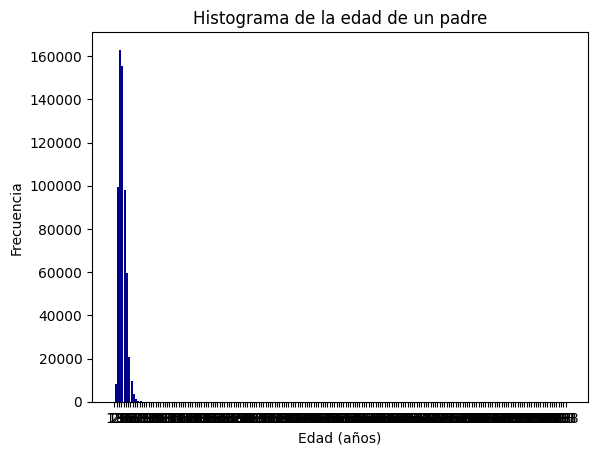

In [22]:
intervalos = range(min(df.EDAD_PADRE), max(df.EDAD_PADRE) + 1, 5)
plt.hist(df.EDAD_PADRE, bins=intervalos, color='darkblue', rwidth=0.85)
plt.title('Histograma de la edad de un padre')
plt.xlabel('Edad (años)')
plt.ylabel('Frecuencia')
plt.xticks(intervalos)
plt.show()

In [23]:
df1 = df[(df.EDAD_PADRE < 120) & (df.EDAD_MADRE != 99) & (df.N_EMB != 99)]
df1.head(5)

,EDAD_PADRE,EDAD_MADRE,N_EMB
COD_DPTO,,,
44,20,4,1
44,20,4,1
44,20,5,1
44,20,5,1
44,20,3,1


<ipython-input-24-cbfc31be47a0>:9: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



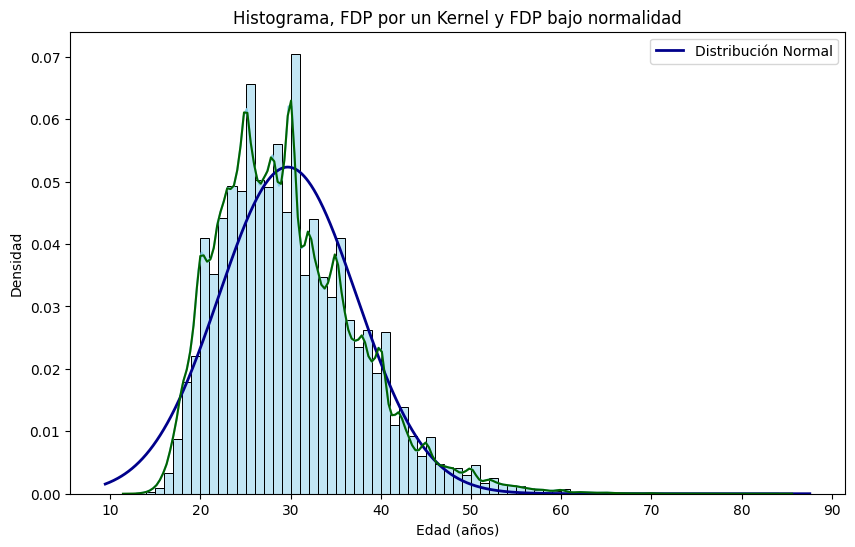

In [24]:
intervalos1 = range(min(df1.EDAD_PADRE), max(df1.EDAD_PADRE) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X:=$ Edad del padre de un recien nacido en Colombia

Descriptivamente como la funcion de densidad de probabilidad de los datos estimada por un metodo Kernel (Linea Verde) no coincide con la funcion de densidad de probabilidad bajo normalidad (Linea azul)
$X\sim \text{Normal} (\text{media} = \bar{x}, \text{Varianza}= S^2_x)$
entonces no asumimos normalidad

In [12]:
shapiro(df1.EDAD_PADRE)


/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


ShapiroResult(statistic=0.958814799785614, pvalue=0.0)

Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%
Si el **valor p **en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria de la edad de un padre de un recién nacido en Colombia presenta distribución normal

In [ ]:
df1.EDAD_PADRE.count()
len(df1.EDAD_PADRE)

619932

In [14]:
idx = np.random.randint(len(df1.EDAD_PADRE), size = 100)
shapiro(df1.EDAD_PADRE.index[idx])


ShapiroResult(statistic=0.8933913111686707, pvalue=7.002816460044414e-07)

Como el valor p es menor a 0.05 se rechaza que la variable aleatoria de la edad de un padre de un recien nacido en Colombia presenta distribucion Normal



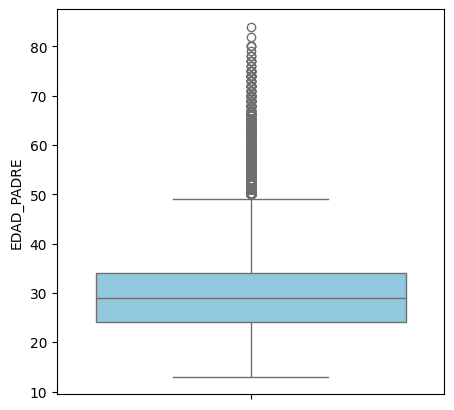

In [25]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.EDAD_PADRE, color='skyblue', saturation=0.75)
plt.show()

Se considera que la edad de un padre de un recién nacido en Colombia es atípica si es mayor que 50 años. El primer cuartil es aproximadamente 25 años, la media aritmética es aproximadamente 29 años y el tercer cuartil es aproximadamente 35 años.

Rango Intercuartilico= 10

In [16]:
plt.figure(figsize=(5, 5))
fig = px.strip(df1.EDAD_PADRE, orientation = 'h')
fig.show()

<Figure size 500x500 with 0 Axes>

In [17]:
print(f"Media: {np.mean(df1.EDAD_PADRE)}")
print(f"Varianza {np.var(df1.EDAD_PADRE)} y la desviación estándar es de {np.std(df1.EDAD_PADRE)}")
print(f"Asimetría: {skew(df1.EDAD_PADRE)}")
print(f"Curtosis: {kurtosis(df1.EDAD_PADRE)}")


Media: 29.67728396017628
Varianza 58.13749376325272 y la desviación estándar es de 7.624794670235568
Asimetría: 0.8353050307248143
Curtosis: 0.9739372918657319


Aproximadamente el promedio de la edad de un padre de un recién nacido en Colombia es de 29.7 años

Aproximadamente la distancia entre los valores de la edad edad un padre de un recién nacido en Colombia y la media es de 7.62 años

La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria

La distribución es platicúrtica, es decir, hay una baja concentración de las edades de un padre de un recién nacido en Colombia con respecto a la media

**¿Cómo se comporta la variable aleatoria del número de embarazos incluido el presente (N_EMB)?**

<ipython-input-26-2f78539d0486>:9: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.



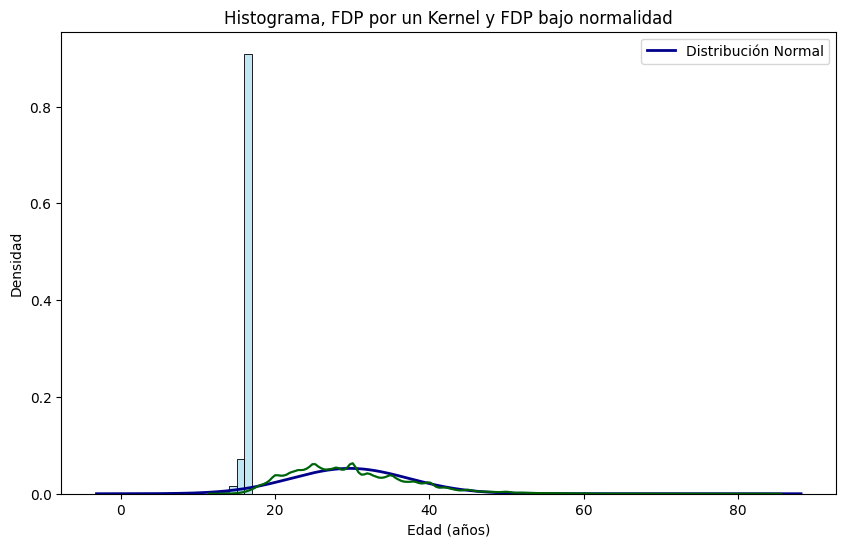

In [26]:
intervalos1 = range(min(df1.N_EMB), max(df1.N_EMB) + 1)
plt.figure(figsize=(10, 6))
sns.histplot(x = df1.EDAD_PADRE, bins = intervalos1, kde = True, stat = "density", color = "skyblue", edgecolor='black') # kde = True es la gráfica de la función de densidad de probabilidad estimada por un método Kernell

xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 1000)
p = norm.pdf(x, np.mean(df1.EDAD_PADRE), np.std(df1.EDAD_PADRE))

plt.plot(x, p, 'k', linewidth=2, label='Distribución Normal', color = "darkblue")
sns.kdeplot(x=df1.EDAD_PADRE, color = "darkgreen")

plt.title('Histograma, FDP por un Kernel y FDP bajo normalidad')
plt.xlabel('Edad (años)')
plt.ylabel('Densidad')
plt.legend()

# Mostrar el gráfico
plt.show()

Sea $X:=$ Numero de embarazos incluido el presente

Descriptivamente como la funcion de densidad de probabilidad de los datos estimada por un metodo Kernel (Linea cyan) no coincide con la funcion de densidad de probabilidad bajo normalidad (Linea azul)
$X\sim \text{Normal} (\text{media} = \bar{x}, \text{Varianza}= S^2_x)$
entonces no asumimos normalidad

In [27]:
shapiro(df1.N_EMB)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning:

p-value may not be accurate for N > 5000.



ShapiroResult(statistic=0.7744329571723938, pvalue=0.0)

Si el **valor p** en una prueba de hipótesis es menor que 0.05 se rechaza la hipótesis nula con una confianza del 95%
Si el **valor p **en una prueba de hipótesis es mayor que 0.05 no se rechaza la hipótesis nula con una confianza del 95%

En nuestro caso particular, tenemos que pvalue=0.0 < 0.05, es decir, se rechaza que la variable aleatoria numero de embarazos incluido el presente  presenta distribución normal

In [28]:
df1.N_EMB.count()
len(df1.N_EMB)

619932

In [29]:
idx = np.random.randint(len(df1.N_EMB), size = 100)
shapiro(df1.N_EMB.index[idx])


ShapiroResult(statistic=0.8853615522384644, pvalue=3.0818173968327756e-07)

Se rechaza que la variable aleatoria numero de embarazos incluido el presente presanta distribucion normal


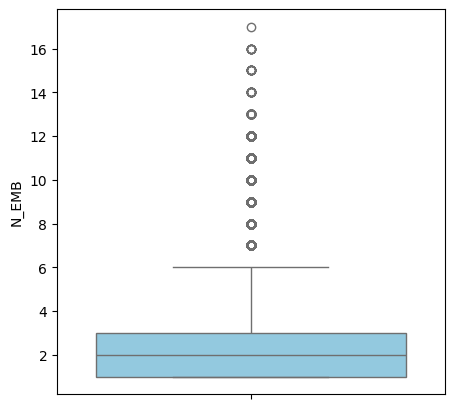

In [31]:
plt.figure(figsize=(5, 5))
sns.boxplot(df1.N_EMB, color='skyblue', saturation=0.75)
plt.show()


Se considera que el numero de embarazos incluido el presente es atípico si es mayor que 6 embarazos . El primer cuartil es aproximadamente 1 embarazo, la media aritmética es aproximadamente 2 embarazos  y el tercer cuartil es aproximadamente 3 embarazos.

Por tanto el rango intercuartilico es 2 embarazos

In [32]:
print(f"Media: {np.mean(df1.N_EMB)}")
print(f"Varianza {np.var(df1.N_EMB)} y la desviación estándar es de {np.std(df1.N_EMB)}")
print(f"Asimetría: {skew(df1.N_EMB)}")
print(f"Curtosis: {kurtosis(df1.N_EMB)}")


Media: 2.102030545285612
Varianza 1.7488730440590166 y la desviación estándar es de 1.32244963762671
Asimetría: 1.9222969798771323
Curtosis: 6.016495893676325


Aproximadamente el promedio de numero de embarazos en Colombia es de 2 embarazos
Aproximadamente la distancia entre los valores el Numero de embarazos en Colombia y la media es de aproximadamemte 1 embarazo

La distribución de la edad de un padre de un recién nacido en Colombia es asimétrica positiva, es decir, la media es mayor que la moda de la variable aleatoria

La distribución es leptocurtica, es decir, hay una alta concentración de los numeros de embarazos en Colombia con respecto a la media

**¿Están correlacionadas y qué grado de correlación tienen ambas variables? **






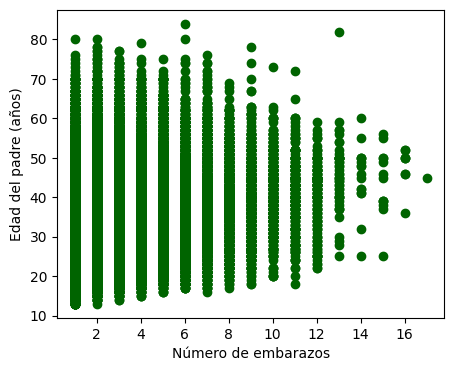

In [33]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "darkgreen", marker = "o")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()


Se observa en el diagrama de dispersión una nube de puntos sin un patrón particular, esto quiere decir que las variables son independientes o no están correlacionadas. Para nuestro ejemplo quiere decir que el número de Embarazos  y la edad de un padre en Colombia no están correlacionadas

In [37]:
modelo = LinearRegression()
# df1["N_EMB"] es igual a escribir df1.N_HIJOSV
modelo.fit(np.array(df1.N_EMB).reshape(-1, 1), np.array(df1["EDAD_PADRE"]).reshape(-1, 1))
predi_lineal = modelo.predict(np.array(df1.N_EMB).reshape(-1, 1))
predi_lineal


array([[27.43380069],
       [27.43380069],
       [27.43380069],
       ...,
       [29.469573  ],
       [27.43380069],
       [27.43380069]])

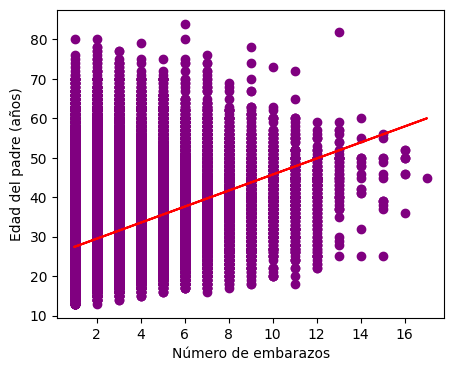

In [38]:
plt.figure(figsize=(5, 4))
plt.scatter(df1["N_EMB"], df1["EDAD_PADRE"], color = "purple", marker = "o")
plt.plot(df1["N_EMB"], predi_lineal, linestyle='-', color = "red")
plt.xlabel('Número de embarazos')
plt.ylabel('Edad del padre (años)')
plt.show()


De acuerdo con la recta de regresión se determina una correlación positiva, es decir que entre más embarazos tiene un hombre en Colombia, más años tiene esta persona.

La variable Y depende positivamente de la variable X, es decir, entre mayor valor de X se tenga, mayor será el valor de Y

In [39]:
coef_pearson = np.corrcoef(df1["N_EMB"], df1["EDAD_PADRE"])[0, 1]
coef_spearman, _ = spearmanr(df1["N_EMB"], df1["EDAD_PADRE"])
coef_kendall, _ = kendalltau(df1["N_EMB"], df1["EDAD_PADRE"])
print(f"Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente {coef_pearson}, {coef_spearman} y {coef_kendall}.")


Los coeficientes de correlación de Pearson, Spearman y Kendall son respectivamente 0.3530857510781986, 0.37998015979212696 y 0.29695921176068596.


De acuerdo con los coeficientes de correlación de Pearson, de Kendall y de Spearman se determina que el número de embarazos y la edad de un padre de un recién nacido en Colombia están discretamente correlacionadas.